In [1]:
library(data.table)
library(foreach)
library(dplyr)
library(ggplot2)
library(ykmeans)
library(reshape2)


Attaching package: 'dplyr'

The following objects are masked from 'package:data.table':

    between, last

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


Attaching package: 'reshape2'

The following objects are masked from 'package:data.table':

    dcast, melt



In [2]:
click.data <- as.data.frame( fread("click_data_sample.csv") )
head(click.data)

,click.at,user.id,campaign.id
1,2015-04-27 20:40:40,144012,Campaign077
2,2015-04-27 00:27:55,24485,Campaign063
3,2015-04-27 00:28:13,24485,Campaign063
4,2015-04-27 00:33:42,24485,Campaign038
5,2015-04-27 01:00:04,24485,Campaign063
6,2015-04-27 16:10:29,145066,Campaign103


In [3]:
click.user.data <-  click.data %>%
                    group_by(user.id) %>%
                    summarise(click.num=length(click.at)) %>%

                    as.data.frame() %>%
                    arrange(desc(click.num)) %>%
                    mutate(no=1:length(user.id))
head(click.user.data)

,user.id,click.num,no
1,22975,916,1
2,30292,767,2
3,107624,761,3
4,41760,636,4
5,121150,596,5
6,104681,550,6


In [4]:
click.user.data <- ykmeans(click.user.data, "click.num", "click.num", 3)
table(click.user.data$cluster)


    1     2     3 
75104   378    63 

In [5]:
target.click.user <-    click.user.data %>%
                        filter( cluster>=2 )
click.data <-   click.data %>%
                filter( user.id %in% target.click.user$user.id )

In [6]:
click.data.campaign <-  click.data %>%
                        group_by(user.id,campaign.id) %>%
                        summarise(click.num=length(click.at)) %>%
                        as.data.frame()

In [7]:
click.data.cast <- as.data.frame(
    dcast.data.table(data=as.data.table(click.data.campaign),
                 formula=user.id~campaign.id,
                 value.var="click.num",
                 fun.aggregate=sum) )

In [8]:
click.data.cast$total <- rowSums(click.data.cast[,-1])
head(click.data.cast,2)

,user.id,Campaign001,Campaign003,Campaign004,Campaign005,Campaign009,Campaign010,Campaign011,Campaign012,Campaign014,ellip.h,Campaign120,Campaign122,Campaign123,Campaign124,Campaign125,Campaign127,Campaign130,Campaign131,Campaign133,total
1,507,0,0,0,0,0,0,51,0,0,<8b>,0,0,0,0,0,0,0,0,0,51
2,510,0,0,0,0,0,0,0,0,0,<8b>,0,0,0,0,0,0,46,0,0,197


In [9]:
click.data.cast1 <- click.data.cast
keys <- names(click.data.cast1)[-c(1,ncol(click.data.cast1))]
click.data.cast.cluster1 <- ykmeans(click.data.cast1,keys,"total",3:6)
table(click.data.cast.cluster1$cluster)


  1   2   3 
353  53  35 

例23 prcomp関数による主成分分析

In [10]:
click.data.cast3 <- click.data.cast
click.data.cast3[,keys] <- click.data.cast3[,keys] / click.data.cast3$total

In [11]:
# PCA
click.data.cast3.pc <- as.data.frame( prcomp(click.data.cast3[,keys], scale=T)$x)
click.data.cast3.pc$user.id <- click.data.cast3$user.id
click.data.cast3.pc$total <- click.data.cast3$total
pc.keys <- names(click.data.cast3.pc)[1:length(keys)]

クラスタリングの実行

In [12]:
click.data.cast.cluster3 <- ykmeans(click.data.cast3.pc, pc.keys, "total", 3:6)
table(click.data.cast.cluster3$cluster)


  1   2   3   4   5 
 23  77 105 235   1 

例24 クラスタ別キャンペーン別の平均値の算出

In [13]:
click.data.cast3$cluster <- click.data.cast.cluster3$cluster
click.data.cast.cluster3.melt <- melt(click.data.cast3, id.vars=c("user.id","cluster"), measure.vars=keys)
click.cluster3.summary <- click.data.cast.cluster3.melt %>%
    group_by(cluster,variable) %>%
    summarise(value=mean(value)) %>%
    as.data.frame()

例25 クラスタ別ユーザ別の分布を描画

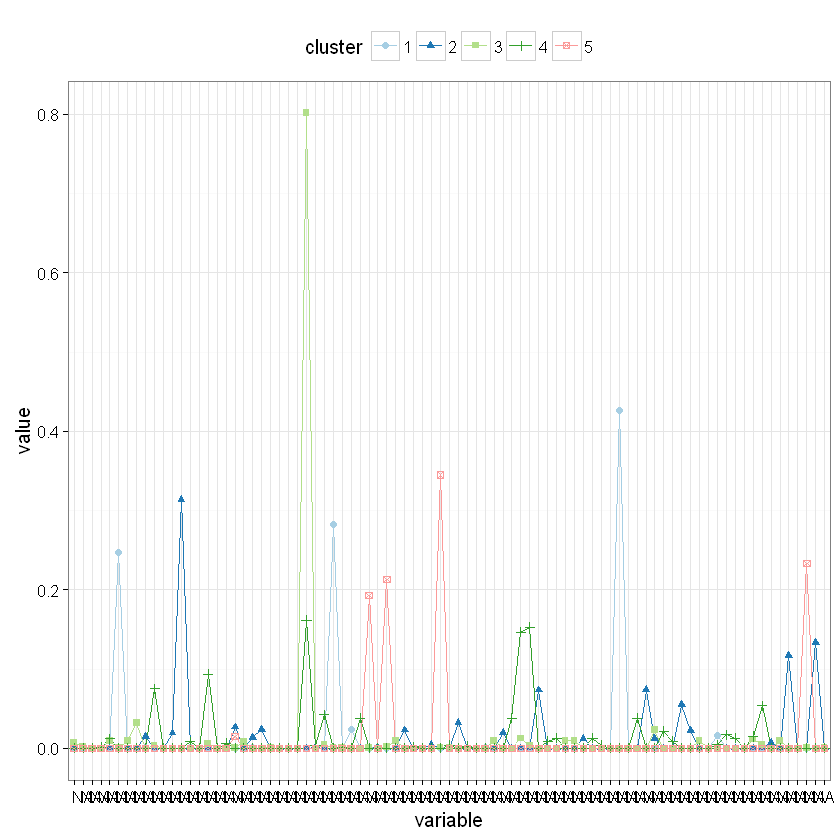

In [14]:
click.cluster3.summary$cluster <- as.factor(click.cluster3.summary$cluster)
ggplot(click.cluster3.summary,aes(x=variable, y=value, col=cluster, group=cluster, shape=cluster)) +
    geom_line() +
    geom_point() +
    scale_x_discrete(label="") +
    theme_bw() +
    theme(legend.position="top") +
    scale_color_brewer(palette="Paired")

例26 クラスタ別ユーザ別キャンペーンクリック数の分布

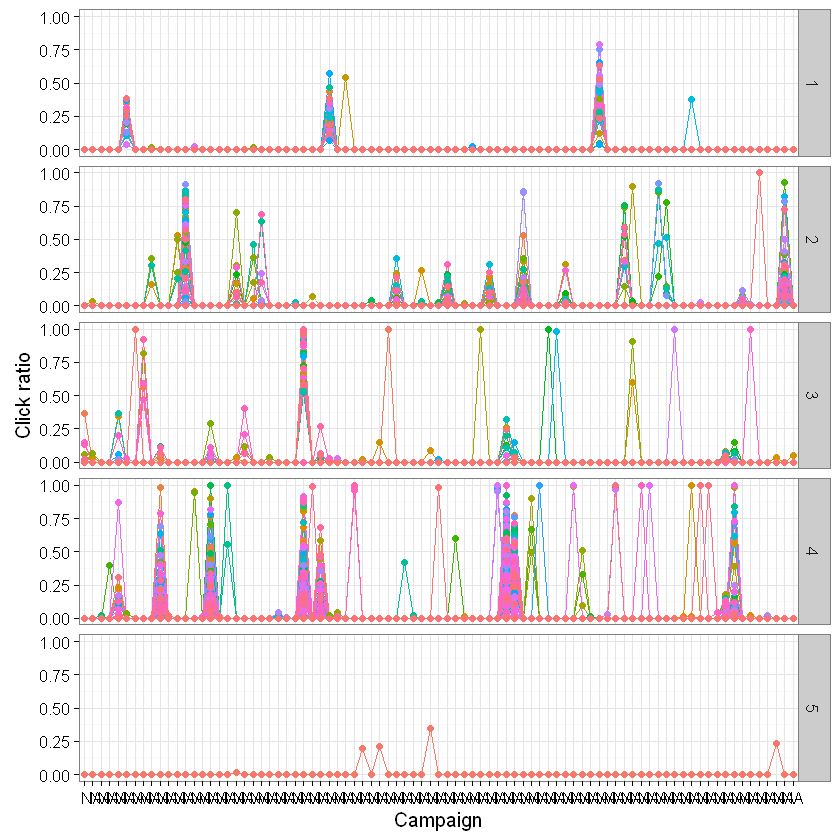

In [15]:
ggplot(click.data.cast.cluster3.melt, aes(x=variable, y=value, col=as.factor(user.id), group=user.id)) +
    geom_line() +
    geom_point() +
    xlab("Campaign") +
    ylab("Click ratio") +
    scale_x_discrete(label="") +
    facet_grid(cluster~.) +
    theme_bw() +
    theme(legend.position="noe")

例27 クラスタ別平均クリック数の算出

In [16]:
click.cluster3.summary2 <- 
    click.data.cast3 %>%
    group_by(cluster) %>%
    summarise(click.avg=mean(total)) %>%
    as.data.frame()
click.cluster3.summary2

,cluster,click.avg
1,1,54.95652
2,2,64.84416
3,3,98.13333
4,4,163.0468
5,5,197


例28 クラスタ別平均クリック数の描画

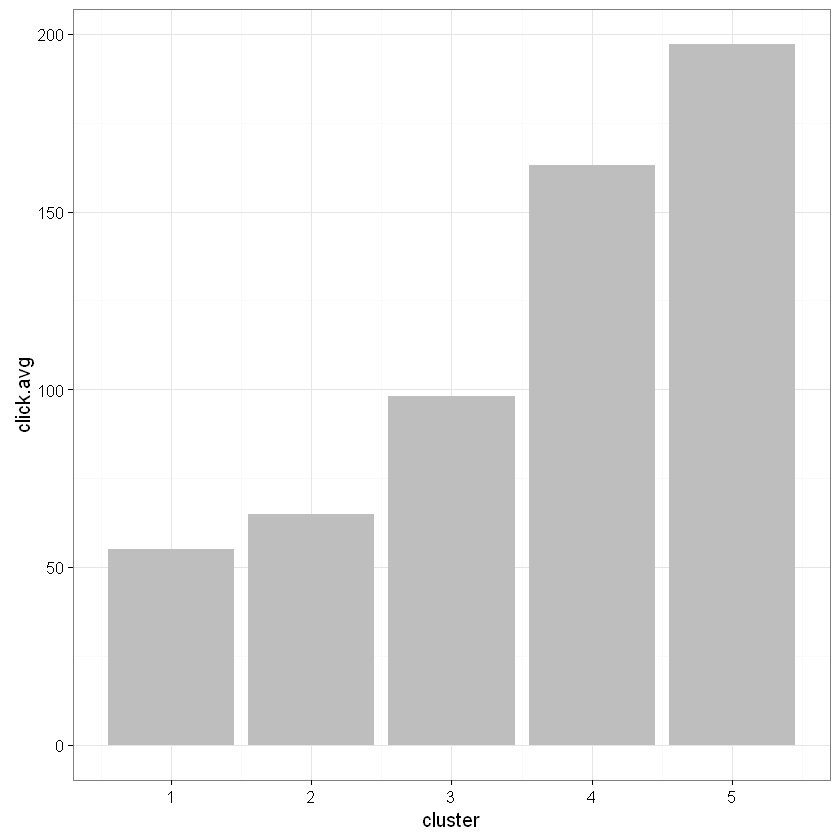

In [17]:
ggplot(click.cluster3.summary2, aes(x=cluster, y=click.avg)) +
    geom_bar(stat="identity", fill="grey") +
    theme_bw()

例29 大きさ、形、PCAを組み合わせてセグメントを実行

In [18]:
click.data.cast2 <- click.data.cast
click.data.cast2[,keys] <- click.data.cast2[,keys] / click.data.cast2$total

variable.data <- 
    as.data.frame(rbind_all(foreach(k=3:6) %do% {
        cluster.data1 <- ykmeans(click.data.cast1, keys, "total", k)[,c("user.id","cluster")]
        cluster.data2 <- ykmeans(click.data.cast2, keys, "total", k)[,c("user.id","cluster")]
        cluster.data3 <- ykmeans(click.data.cast3.pc, pc.keys, "total", k)[,c("user.id","cluster")]
        cluster.data1$cluster.type <- sprintf("size.%s.cluster",k)
        cluster.data2$cluster.type <- sprintf("prop.%s.cluster",k)
        cluster.data3$cluster.type <- sprintf("pca.%s.cluster",k)
        rbind_all(list(cluster.data1, cluster.data2, cluster.data3))
    }))
variable.data.cast <- as.data.frame(
    dcast.data.table(data = as.data.table(variable.data),
                    formula = user.id~cluster.type,
                    value.var = "cluster")
)
head(variable.data.cast)

,user.id,pca.3.cluster,pca.4.cluster,pca.5.cluster,pca.6.cluster,prop.3.cluster,prop.4.cluster,prop.5.cluster,prop.6.cluster,size.3.cluster,size.4.cluster,size.5.cluster,size.6.cluster
1,507,2,2,3,4,1,2,2,2,1,1,1,1
2,510,3,4,5,6,1,2,2,2,1,1,1,1
3,897,2,3,3,4,2,3,3,4,1,1,2,2
4,991,2,3,3,4,2,3,3,4,1,1,2,2
5,1663,2,2,3,4,1,2,2,2,1,1,1,1
6,1871,3,4,4,5,3,4,5,6,1,1,1,1


例30 CVRデータの作成 

In [19]:
cv.data <- as.data.frame(fread("cv_data_sample.csv"))
target.cv.data <- 
    cv.data %>%
    group_by(user.id) %>%
    summarise(cv.num=length(cv.at)) %>%
    as.data.frame()
target.cvr.data <- 
    as.data.frame(
        merge(as.data.table(target.click.user[,c("user.id","click.num")]),
             as.data.table(target.cv.data),
             by="user.id",
                 all.x=T))
target.cvr.data[is.na(target.cvr.data)] <- 0
target.cvr.data$cvr <- target.cvr.data$cv.num / target.cvr.data$click.num

例31 説明変数データとの結合

In [20]:
target.data <-
    as.data.frame(
        merge(as.data.table(variable.data.cast),
             as.data.table(target.cvr.data[,c("user.id","cvr")]),
             by="user.id",
             all.x=T))
target.data[is.na(target.data)] <- 0

例32 予測モデルの構築

library installが必要
- rpart
- rpart.plot
- rattle
- RGtk2

In [21]:
library(rpart)
library(rattle)

Rattle は、R のデータマイニングに使用する、無償のグラフィカルインターフェースです。
バージョン 4.1.0 Copyright (c) 2006-2015 Togaware Pty Ltd.
'rattle()' と入力して、データを多角的に分析します。


クラスタ番号を因子型に変換

In [22]:
target.data[,-c(1,ncol(target.data))] <- apply(target.data[,-c(1,ncol(target.data))], 2, as.factor)

決定木の実行

In [23]:
cvr.fit <- rpart(cvr~., data=target.data[,-1])

例33 決定木の描画

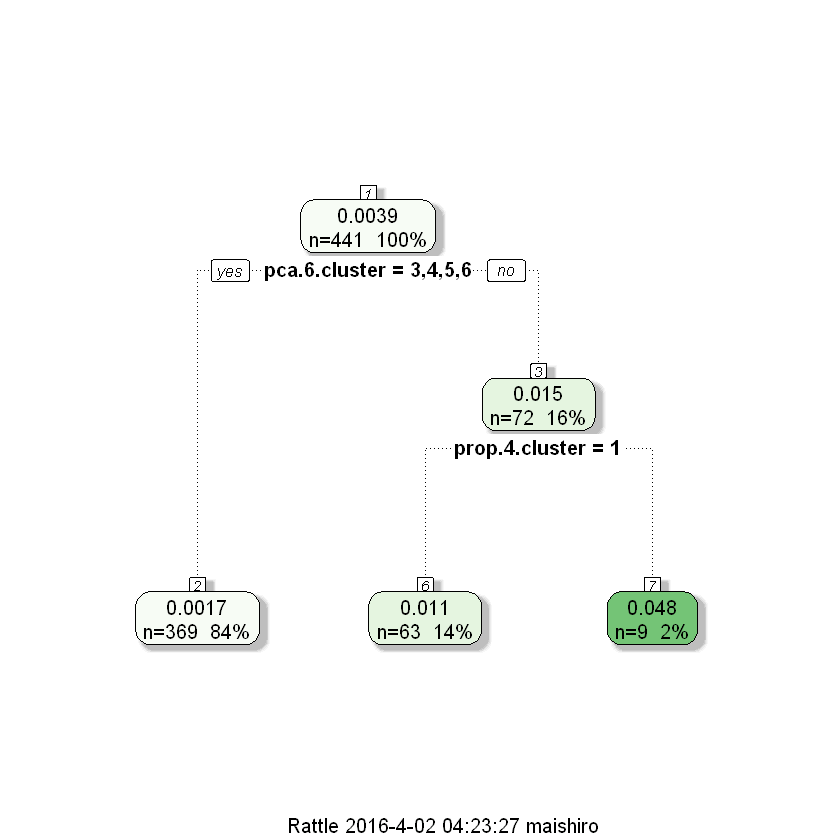

In [24]:
fancyRpartPlot(cvr.fit)
#par(xpd = NA)
#plot(cvr.fit, uniform=TRUE, margin=0.2)
#text(cvr.fit, use.n=TRUE, all=TRUE)

例34 クラスタリングの実行

In [25]:
click.data.cast.cluster3 <- ykmeans(click.data.cast3.pc, pc.keys, "total", 6)
click.data.cast3$cluster <- click.data.cast.cluster3$cluster
click.data.cast.clsuter3.melt <- melt( click.data.cast3, id.vars = c("user.id","cluster"), measure.vars = keys)
click.cluster3.summary <- click.data.cast.cluster3.melt %>%
    group_by(cluster, variable) %>%
    summarise(value=mean(value)) %>%
    as.data.frame()

例35 クラスタ別の特徴を描画

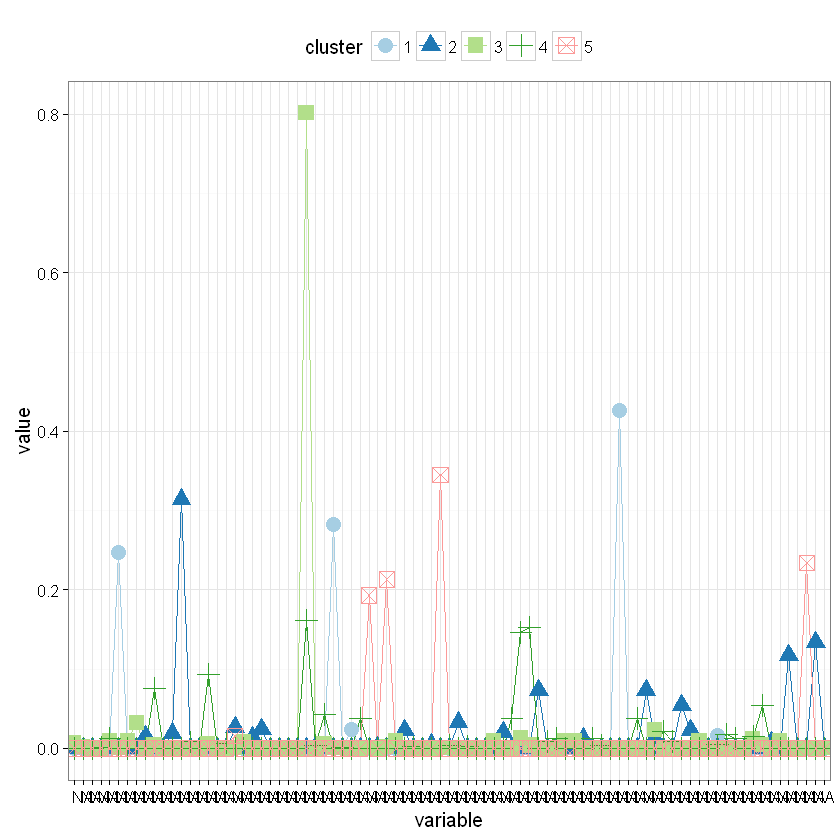

In [26]:
click.cluster3.summary$cluster <- as.factor(click.cluster3.summary$cluster)
ggplot(click.cluster3.summary, aes(x=variable, y=value, col=cluster, group=cluster, shape=cluster)) +
    geom_line() +
    geom_point(size=4) +
    scale_x_discrete(label="") +
    theme_bw() +
    theme(legend.position="top") +
    scale_color_brewer(palette="Paired")